### Telecom churn prediction:
**Faseela K Karim**

In [1]:
# import relevant packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy import stats
from scipy.stats import norm
%matplotlib inline
from statsmodels.stats.outliers_influence import variance_inflation_factor


### **Introduction**

Variance Inflation Factor (VIF) is a statistical method used to measure the degree of multicollinearity among a set of predictor variables in a multiple regression model. It is an important tool in the field of statistics and data analysis, as it allows for the identification of collinear variables, which can lead to biased regression coefficients and reduced predictive power.

The VIF measures the extent to which the variance of the estimated regression coefficient is increased due to multicollinearity in the data. In essence, it quantifies the degree to which a predictor variable can be explained by the other predictor variables in the model. A high VIF value indicates that the variable is highly correlated with the other variables in the model, while a low VIF value indicates that the variable is independent of the other variables.

The use of VIF is particularly important in logistic regression, where the goal is to model the probability of an event occurring based on a set of predictor variables. In logistic regression, it is important to identify and remove collinear variables from the model to obtain unbiased and efficient estimates of the regression coefficients. Collinearity can also lead to instability in the logistic regression model, making it difficult to obtain reliable predictions.

The process of identifying and removing collinear variables using VIF involves calculating the VIF values for each predictor variable in the model. A VIF value greater than 1 indicates some degree of collinearity, while a VIF value greater than 5  indicates high collinearity. Variables with high VIF values should be removed from the model.

In summary, VIF is a powerful statistical method used to identify and address multicollinearity in multiple regression models, particularly in the case of logistic regression. By using VIF to remove collinear variables from the model, analysts can obtain unbiased and efficient estimates of the regression coefficients and improve the predictive power of the model.

So here we are trying to remove the correlated features, also try to find some factors which are highly correlated to the target variable.

## Table of Contents
1. [Independence or No Multicollienearity](#Multicollienearity)
2. [Finding VIF and Deleting columns](#vif)
3. [Correlation of independent features with target variable](#Correlation)
5. [Conclusion](#Conclusion)



In [2]:
# #connect to google drive
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# #load the train data
# df=pd.read_csv('/content/drive/My Drive/final_capstone/train_data_onehot.csv',index_col=0)

In [4]:
# #load the test data
# df_test=pd.read_csv('/content/drive/My Drive/final_capstone/test_data_onehot.csv',index_col=0)

In [1]:
#load the train data
df=pd.read_csv('data/train_data_onehot.csv',index_col=0)


df_test=pd.read_csv('data/test_data_onehot.csv',index_col=0)

NameError: name 'pd' is not defined

In [3]:
#checking the shape of the dataset
df.shape

(75000, 126)

In [48]:
df.head()

,rev_Mean,mou_Mean,totmrc_Mean,da_Mean,ovrmou_Mean,ovrrev_Mean,vceovr_Mean,datovr_Mean,roam_Mean,change_mou,...,ethnic_J,ethnic_M,ethnic_N,ethnic_O,ethnic_P,ethnic_R,ethnic_S,ethnic_U,ethnic_X,churn
0,44.990,366.75,52.49,0.00,0.0,0.000,0.000,0.0,0.0000,31.25,...,0,0,0,0,0,0,0,0,0,1
1,49.990,115.00,59.99,0.00,0.0,0.000,0.000,0.0,0.0000,-3.00,...,0,0,0,0,0,0,0,0,0,1
2,30.260,337.75,39.99,0.00,1.5,0.525,0.525,0.0,0.0000,24.25,...,0,0,0,0,0,0,1,0,0,0
3,49.605,223.25,39.99,0.00,38.0,13.300,13.300,0.0,3.4125,332.75,...,0,0,0,0,0,0,0,0,0,1
4,51.295,647.50,59.99,0.99,0.0,0.000,0.000,0.0,0.0000,-522.50,...,0,0,1,0,0,0,0,0,0,1


In [4]:
#Seperate target variable 'churn' and other features into X_train and y_train variables
X_train=df.drop('churn',axis=1)
y_train=df['churn']

### Independence or No Multicollienearity<a name="Multicollienearity"></a>

One important assumption when building a logistic regression is that there is no collinearity: the predictor variables are independent of each other.

We can use `corr()` to display a correlation matrix of the dataset:

A correlation matrix is a table showing correlation coefficients between sets of variables. Each variable in the table is correlated with each of the other values in the table. This allows us to see which pairs have the highest correlation. Correlation falls on a range of [-1,1], 
- -1 indicates a perfect negative correlation relationship.
- 0 indicates no correlation relationship.
- and 1 indicates a perfect positive correlation relationship.

Large tables like this are hard to parse through, let's visualize the correlation using a heatmap:

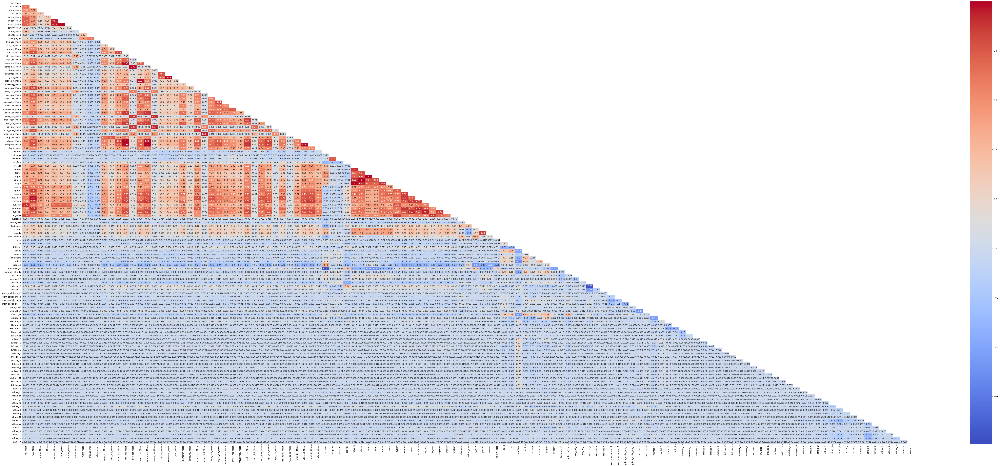

In [7]:
# Correlation of the variables in a heatmap
plt.figure(figsize=(100,40))
matrix = np.triu(X_train.corr())
sns.heatmap(X_train.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.show()


As we can see above, there is a lot of collinearity. To remove the multi collinearity between independent features we can use VIF.

Let's look at Variance Inflation Factor (VIF) to detect multicollinearity

When there is no multicollinearity, the VIF for each predictor should be 1. Usually, any VIF value higher than 5 indicates high collinearity.

In [5]:
#created an empty list to store the columns with high multicolliearity
list_of_variables_to_delete=[]

In [90]:
X_train.shape

(75000, 125)

### **Finding VIF and Deleting columns**<a name="vif"></a>

The function defined here is used to calculate the Variance Inflation Factor (VIF) for each feature in a dataset. The VIF is a measure of how much the variance of the estimated regression coefficient is increased due to collinearity in the data. When the VIF value for a particular feature is greater than 5, it indicates a high level of collinearity with other features in the dataset. To address this issue, we can remove one column at a time and continue doing so until all features with a VIF value greater than 5 are removed.So we can define a function to do that.

In [7]:
def find_largest_vif_and_update(X_train, list_of_variables_to_delete):
    """
    This function calculates the variance inflation factor (VIF) for each variable in the given X_train DataFrame,
    finds the variable with the largest VIF, and updates the X_train DataFrame by removing that variable if it's VIF is greater than 5.
    The function also updates the list_of_variables_to_delete by appending the removed variable.

    Parameters
    ----------
    X_train : pandas.DataFrame
        The input DataFrame containing the independent variables for training.
    list_of_variables_to_delete : list
        The list of variables that have been deleted so far.

    Returns
    -------
    largest_vif : float
        The largest VIF value found in the current iteration.
    largest_vif_variable : str
        The name of the variable with the largest VIF value.
    X_train : pandas.DataFrame
        The updated DataFrame with the variable having the largest VIF removed (if its VIF is greater than 5).
    list_of_variables_to_delete : list
        The updated list of variables 'list_of_variables_to_delete' variable appended (if its VIF is greater than 5).

    """
    import statsmodels.api as sm
    from statsmodels.stats.outliers_influence import variance_inflation_factor

    X_train_const = sm.add_constant(X_train)

    vif_val = pd.Series([variance_inflation_factor(X_train_const.values, i)
                         for i in range(X_train_const.shape[1])],
                        index=X_train_const.columns)[1:]

    # Find the largest VIF value
    largest_vif = max(vif_val)
    #largest_vif_variable is defined inside if, so when vif<5
    #largest_vif_variable will not be defined, so assign a default string initially
    largest_vif_variable='vif less than 5'
    if(largest_vif>5):
      # Find the variable with the largest VIF value
      largest_vif_variable = vif_val.idxmax()

      # Update the list of variables to delete and the X_train DataFrame
      list_of_variables_to_delete.append(largest_vif_variable)
    X_train = X_train.drop(largest_vif_variable, axis=1)

    return largest_vif, largest_vif_variable, X_train, list_of_variables_to_delete


First let's call the function for 40 (just a random number) times to remove the features with high VIF values. The updated list gives the values which we removed from the dataframe based on VIF value. we can remove the same columns  from test data frame.

We can use a for loop to execute the `find_largest_vif_and_update` function 40 times.
This code block calculates the latest VIF value for each variable and stores it in the largest_vif_1 variable. The execution of the code will terminate when the largest_vif_1 variable's value becomes less than 5.

In [92]:
#initialized value of i as 1
i=1
#initialized value of largest_vif_1 as 10, The loop start execution only if 
#largest_vif_1>5 which stores the VIF value returned by the function 'find_largest_vif_and_update'
largest_vif_1=10
for i in range(1,41):
    
  # i=i+1
  #call the function only if last VIF value returned is greater than 5
    if largest_vif_1>5:
        #call the function and store the returned values in the variables,update the input to the function
        largest_vif_1, largest_vif_variable_1, X_train,list_of_variables_to_delete=find_largest_vif_and_update(X_train,list_of_variables_to_delete)




/usr/local/lib/python3.9/dist-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


after  iteration the number of columns reduced from 125 to 90.ie 35 columns removed from dataframe based on the VIF value

In [81]:
#check the shape of X_train 
X_train.shape

(75000, 90)

In [94]:
#display the columns deleted 
list_of_variables_to_delete

['comp_dat_Mean',
 'plcd_vce_Mean',
 'complete_Mean',
 'mou_cvce_Mean',
 'ovrrev_Mean',
 'totcalls',
 'attempt_Mean',
 'adjmou',
 'drop_blk_Mean',
 'ccrndmou_Mean',
 'adjrev',
 'avg3mou',
 'recv_vce_Mean',
 'comp_vce_Mean',
 'rev_Mean',
 'avg6qty',
 'totmou',
 'mou_Mean',
 'mou_cdat_Mean',
 'avgqty',
 'plcd_dat_Mean',
 'avg3rev',
 'avg3qty',
 'crclscod_A',
 'ovrmou_Mean',
 'avgmou',
 'peak_vce_Mean',
 'totrev',
 'opk_vce_Mean',
 'avg6rev',
 'mou_rvce_Mean',
 'avg6mou',
 'ethnic_N',
 'owylis_vce_Mean',
 'models']

In [ ]:
# 'comp_dat_Mean',
#  'plcd_vce_Mean',
#  'complete_Mean',
#  'mou_cvce_Mean',
#  'ovrrev_Mean',
#  'totcalls',
#  'attempt_Mean',
#  'adjmou',
#  'drop_blk_Mean',
#  'ccrndmou_Mean',
#  'adjrev',
#  'avg3mou',
#  'recv_vce_Mean',
#  'comp_vce_Mean',
#  'rev_Mean',
#  'avg6qty',
#  'totmou',
#  'mou_Mean',
#  'mou_cdat_Mean',
#  'avgqty',
#  'plcd_dat_Mean',
#  'avg3rev',
#  'avg3qty',
#  'crclscod_A',
#  'ovrmou_Mean',
#  'avgmou',
#  'peak_vce_Mean',
#  'totrev',
#  'opk_vce_Mean',
#  'avg6rev',
#  'mou_rvce_Mean',
#  'avg6mou',
#  'ethnic_N',
#  'owylis_vce_Mean',
#  'models'

In [8]:
#saved all the columns deleted in another list variable
columns_deleted_based_on_vif_after_40_itr=['plcd_vce_Mean',
 'comp_vce_Mean',
 'comp_dat_Mean',
 'mou_cvce_Mean',
 'ovrrev_Mean',
 'totcalls',
 'attempt_Mean',
 'adjmou',
 'drop_blk_Mean',
 'ccrndmou_Mean',
 'adjrev',
 'avg3mou',
 'recv_vce_Mean',
 'complete_Mean',
 'rev_Mean',
 'avg6qty',
 'totmou',
 'mou_Mean',
 'mou_cdat_Mean',
 'avgqty',
 'plcd_dat_Mean',
 'avg3rev',
 'avg3qty',
 'crclscod_A',
 'ovrmou_Mean',
 'avgmou',
 'peak_vce_Mean',
 'totrev',
 'opk_vce_Mean',
 'avg6rev',
 'mou_rvce_Mean',
 'avg6mou',
 'ethnic_N',
 'owylis_vce_Mean',
 'models']

In [9]:
# X_train.drop(columns=columns_deleted_based_on_vif_after_40_itr,axis=1,inplace=True)

In [10]:
#after deleting all columns with VIF greater than 5, shape of X_train
X_train.shape

(75000, 90)

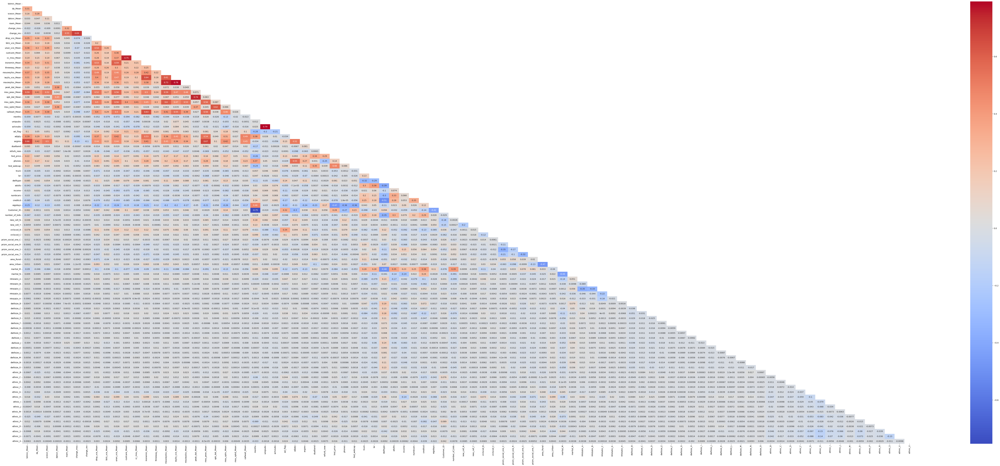

In [11]:
#Correlation of the variables in a heatmap
plt.figure(figsize=(100,40))
matrix = np.triu(X_train.corr())
sns.heatmap(X_train.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.show()

We can see some high corelated values here, lets drop them.

In [12]:
#saved columns with high correlation 
columns=['mou_peav_Mean','cc_mou_Mean']

In [13]:
#dropped the columns with high correlation cofficient
X_train.drop(columns=columns,axis=1,inplace=True)

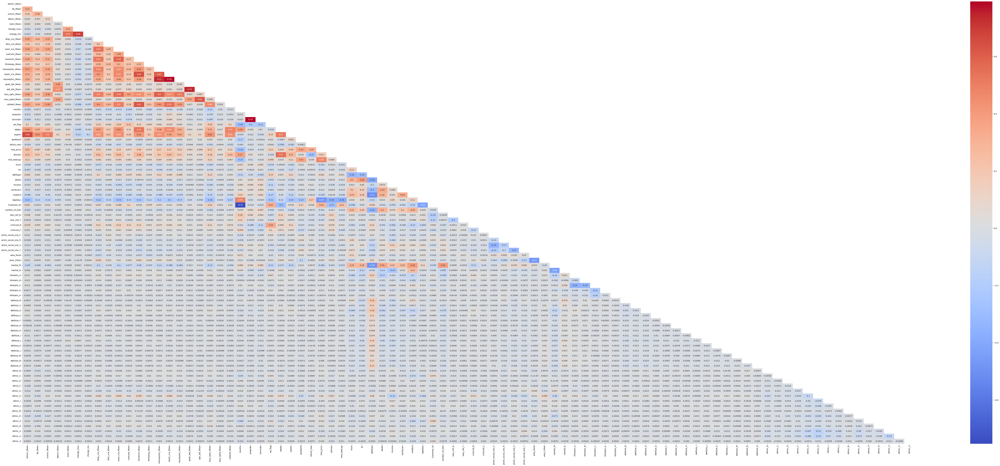

In [14]:
# Correlation of the variables in a heatmap
plt.figure(figsize=(100,40))
matrix = np.triu(X_train.corr())
sns.heatmap(X_train.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.show()

In [15]:
#columns with high correlation coeffiecient
columns_1=['opk_dat_Mean','change_rev','inonemin_Mean','mouiwylisv_Mean']

In [16]:
#drop the columns
X_train.drop(columns=columns_1,axis=1,inplace=True)

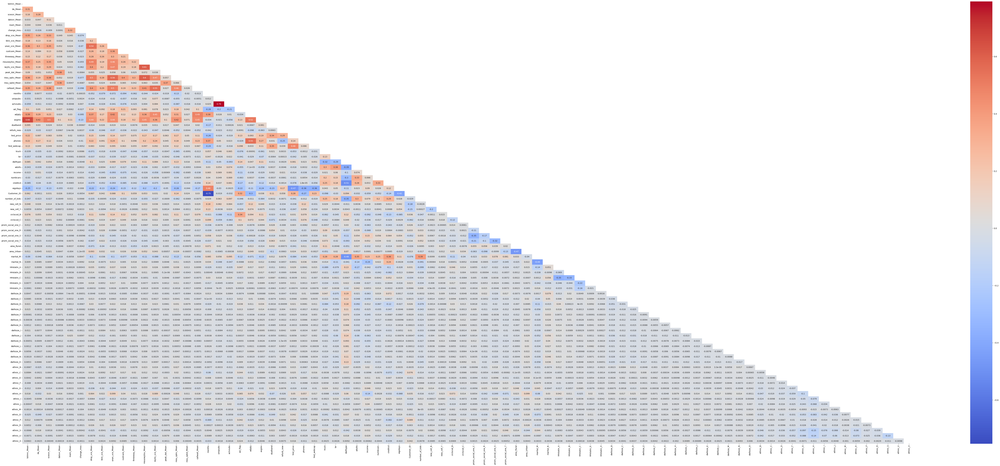

In [17]:
# Correlation of the variables in a heatmap
plt.figure(figsize=(100,40))
matrix = np.triu(X_train.corr())
sns.heatmap(X_train.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.show()

In [18]:
column_2=['avgrev','actvsubs','mou_opkv_Mean','Customer_ID']

In [19]:
X_train.drop(columns=column_2,axis=1,inplace=True)

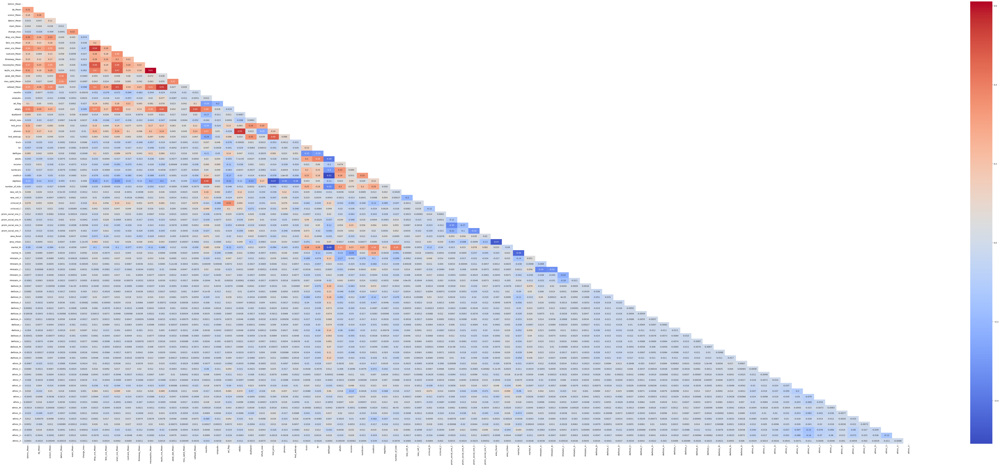

In [20]:
# Correlation of the variables in a heatmap
plt.figure(figsize=(100,40))
matrix = np.triu(X_train.corr())
sns.heatmap(X_train.corr(), annot=True, mask=matrix, cmap='coolwarm')
plt.show()

In [20]:
#shape of X_train
X_train.shape

(75000, 80)

In [21]:
#concatenate and X_train with target variable y_train
final_train_df=pd.concat([X_train, y_train], axis=1)

In [22]:
final_train_df.head()

,totmrc_Mean,da_Mean,vceovr_Mean,datovr_Mean,roam_Mean,change_mou,drop_vce_Mean,blck_vce_Mean,unan_vce_Mean,custcare_Mean,...,ethnic_I,ethnic_J,ethnic_M,ethnic_O,ethnic_P,ethnic_R,ethnic_S,ethnic_U,ethnic_X,churn
0,52.49,0.00,0.000,0.0,0.0000,31.25,2.666667,0.000000,18.333333,2.333333,...,0,0,0,0,0,0,0,0,0,1
1,59.99,0.00,0.000,0.0,0.0000,-3.00,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,1
2,39.99,0.00,0.525,0.0,0.0000,24.25,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,1,0,0,0
3,39.99,0.00,13.300,0.0,3.4125,332.75,7.000000,0.333333,17.333333,0.000000,...,0,0,0,0,0,0,0,0,0,1
4,59.99,0.99,0.000,0.0,0.0000,-522.50,7.666667,0.666667,18.000000,0.000000,...,0,0,0,0,0,0,0,0,0,1


In [23]:
#shape of final dataframe after deleting columns based on VIF value
final_train_df.shape

(75000, 81)

In [24]:
#save the new dataframe
final_train_df.to_csv('train_data_vif_out.csv')

We need to make the same changes to test data.We need to delete all the columns which are present in test data,but not present in train data.

In [25]:

# Get the column names for each DataFrame
test_columns = set(df_test.columns)
train_columns = set(final_train_df.columns)

# Find the difference between the sets of column names
missing_columns = test_columns.difference(train_columns)

# Convert the set of missing columns back to a list
missing_columns_list = list(missing_columns)

print("Columns in df_test but not in final_train_df:", missing_columns_list)


Columns in df_test but not in final_train_df: ['comp_vce_Mean', 'mou_rvce_Mean', 'Customer_ID', 'ethnic_N', 'models', 'plcd_dat_Mean', 'comp_dat_Mean', 'mou_opkv_Mean', 'attempt_Mean', 'avg6qty', 'avgrev', 'owylis_vce_Mean', 'recv_vce_Mean', 'actvsubs', 'avgmou', 'rev_Mean', 'mou_cdat_Mean', 'complete_Mean', 'mouiwylisv_Mean', 'adjmou', 'mou_peav_Mean', 'totrev', 'avg3rev', 'totmou', 'cc_mou_Mean', 'ccrndmou_Mean', 'opk_dat_Mean', 'plcd_vce_Mean', 'peak_vce_Mean', 'change_rev', 'adjrev', 'totcalls', 'opk_vce_Mean', 'inonemin_Mean', 'ovrrev_Mean', 'mou_cvce_Mean', 'mou_Mean', 'ovrmou_Mean', 'avg6rev', 'crclscod_A', 'avg6mou', 'drop_blk_Mean', 'avg3mou', 'avg3qty', 'avgqty']


In [26]:
#delete columns with high VIF value and correlation coeffient from test dataframe
df_test.drop(columns=missing_columns_list,axis=1,inplace=True)

In [28]:
#save the test data
df_test.to_csv('test_data_vif_out.csv')

In [29]:
#shape of test dataframe
df_test.shape

(25000, 81)

In [30]:
#shape of train dataframe
final_train_df.shape

(75000, 81)

### **Correlation of independent features with target variable**<a name="Correlation"></a>

Create a function named  `pearson_df`  to find the correlation of different features with the target variable

In [31]:
from scipy.stats import pearsonr

def pearson_df(dataframe, target, alpha=0.05):
    '''
    This function takes a dataframe with a column of interest (target), a significance threshold (alpha) as inputs. It then calculates the correlation coefficients
    and p-values using scipy.stats.pearsonr(), and returns a dataframe of the results
    
    Parameters:
    -----------
    dataframe: a pandas dataframe containing the data to compare
    target: a string specifying one of the columns in the dataframe to compare to the rest of the data
    alpha: a significance threshold for evaluating p-values (default 0.05)
    
    Returns:
    --------
    output: a dataframe containing correlation coefficients and p-values for each variable in dataframe w.r.t. the target variable
    
    '''
    
    # Validate the inputs
    assert isinstance(dataframe, pd.DataFrame), 'dataframe must be a pandas DataFrame'
    assert isinstance(target, str), 'target must be a string'
    assert isinstance(alpha, float), 'alpha must be a float'
    assert(0 <= alpha <= 1), 'alpha must be between 0 and 1'
    
    # Instantiating empty lists
    variable_names = []
    corr_list = []
    p_value_list = []
    
    # Looping across all of the columns in the dataframe
    for column in range(dataframe.shape[1]):
        
        # Calculating the coefficient and p-value for each column w.r.t. the target variable
        corr, p_value = pearsonr(dataframe.iloc[:, column], dataframe[target])
        
        # Add the column name, coefficient, and p-value to their respective lists
        variable_names.append(dataframe.columns[column])
        corr_list.append(corr)
        p_value_list.append(p_value)

    # Turn the three lists into a dataframe for easier viewing
    output = pd.DataFrame(index=variable_names, data={'coefficient': corr_list, 'p-value': p_value_list})
    
    # Add a column which states whether the correlation is significant
    output[f'p-value <= {alpha}'] = np.where(output['p-value'] <= alpha, True, False)
    
    # Drop the target variable from the dataframe
    output = output.drop(target)
    
    print(f'Correlations between data columns and {target}:')
    
    return output

In [32]:
correlation_df1 = pearson_df(final_train_df, 'churn')
correlation_df1

Correlations between data columns and churn:


,coefficient,p-value,p-value <= 0.05
totmrc_Mean,-0.069612,3.253253e-81,True
da_Mean,-0.012616,5.500273e-04,True
vceovr_Mean,0.023936,5.531948e-11,True
datovr_Mean,-0.001297,7.223752e-01,False
roam_Mean,0.006942,5.728841e-02,False
...,...,...,...
ethnic_P,-0.015825,1.464379e-05,True
ethnic_R,0.006952,5.692893e-02,False
ethnic_S,-0.002697,4.600733e-01,False
ethnic_U,0.002140,5.579001e-01,False


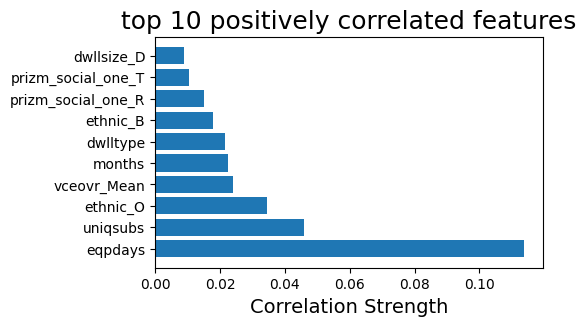

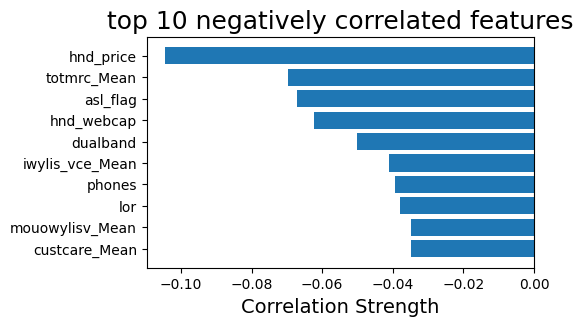

In [33]:
#sort the correlation coefficient dataframe
correlation_df1=correlation_df1.sort_values("coefficient", ascending=False)

#select top 10 positive coeffients, save in new dataframe correlation_df2
correlation_df2=correlation_df1.head(30)
#select top 10 negative coeffients, save in new dataframe correlation_df3
correlation_df3=correlation_df1.tail(30)

#plot top 10 positive coeffients
plt.figure(figsize=(5,3))
correlation_df1.sort_values(by='coefficient', inplace=True)
plt.barh(correlation_df2.index, correlation_df2["coefficient"])
plt.title("top 10 positively correlated features", fontsize=18)
plt.xlabel("Correlation Strength", fontsize=14)
plt.show()

#plot top 10 negative coeffiecients 
plt.figure(figsize=(5,3))
correlation_df1.sort_values(by='coefficient', inplace=True)
plt.barh(correlation_df3.index, correlation_df3["coefficient"])
plt.title("top 10 negatively correlated features", fontsize=18)
plt.xlabel("Correlation Strength", fontsize=14)
plt.show()

- Eqpdays refers to the number of days a customer has had their current equipment. Customers who have had their equipment for a long time may be more likely to churn as they may be more interested in upgrading their equipment.When a customer upgrade the equipment there is a chance that customer move from one service provider to another. 
- Uniqsubs is the number of unique subscriptions a customer has. Customers with multiple subscriptions may be more likely to churn as they may have more options to choose from.
- Ethnic_O and Ethnic_B refer to customers of different ethnicities, and may indicate that customers of certain ethnicities may be more likely to churn.
- Vceover_mean refers to the average monthly revenue from voice over services. Customers who have a high average revenue may be more likely to churn if they find better deals or services from other providers. 
- Months refers to the number of months a customer has been with the company. Customers who have been with the company for a long time may be more likely to churn as they may be looking for change or better options.
- Dwlltype and Dwellsize_D refer to the type and size of the customer's dwelling. Customers who live in certain types (single house) or sizes of dwellings may be more likely to churn due to changes in their living situation or financial circumstances.
-  Prism_social_group R and T refer to the customer's social group, which may also play a role in churn behavior.R is subcategory of T group.T refers to town and rural areas. This churn may be due to poor service of the company in the rural areas.

In summary, these 10 features have been identified as potential factors that contribute to customer churn in the telecom sector. By understanding these factors and taking appropriate measures to address them, companies can improve customer retention and reduce churn.







When some features have negative correlation coefficients, it implies that they have an inverse relationship with the target variable (in this case, churn). In other words, as the value of these features increases, the likelihood of churn decreases.

For example, the handset price and totmrc_mean have a negative correlation with churn. This suggests that customers who have higher handset prices or are paying more for their services are less likely to churn. This could be because they are satisfied with the quality of the services they are receiving or are locked into a long-term contract with the company.

An account spending limit is a maximum amount that a customer can spend on their phone service per month. If a customer reaches this limit, their service will be temporarily suspended until the next billing cycle. By setting a spending limit, customers are less likely to exceed their budget and experience bill shock, which can lead to dissatisfaction and churn.

In addition, setting a spending limit can help companies identify and address potential issues before they become bigger problems. For example, if a customer is consistently reaching their spending limit, it may indicate that their plan is not meeting their needs, and the company can proactively offer a better plan to keep the customer satisfied.

Overall, setting a spending limit can help improve customer satisfaction and reduce churn by providing customers with greater control over their spending and allowing companies to identify and address issues before they escalate.

Dualband is a feature in mobile phones that enables them to operate on two different frequencies. This feature allows customers to have a better network reception, which leads to a better user experience. When a customer has a good user experience with their phone, they are more likely to continue using the service and less likely to churn.

On the other hand, if a customer has a phone that does not have the dualband feature, they may experience poor network reception, call drops, and slow data speeds. This can result in a bad user experience, which may prompt the customer to switch to a different phoneand hence service provider or upgrade to a new phone with better network capabilities. Eventually, this may lead to customer churn.

Therefore, having a dualband feature in a phone can play a significant role in reducing churn. It can improve the customer's experience with the service provider by providing better network coverage and higher data speeds. As a result, the customer is more likely to stay with the service provider and less likely to switch to a competitor.

lor (length of residence) also have a negative correlation with churn. This suggests that customers who have been with the company for longer  less likely to churn. This could be because these customers have a strong relationship with the company and are more loyal.

In conclusion, the negative correlation coefficients for these features suggest that they are important factors in reducing churn. These factors could help companies identify customers who are at risk of churning and take appropriate measures to retain them, such as offering loyalty programs or improved customer service.

### **Conclusion**<a name="Conclusion"></a>

In conclusion, the Variance Inflation Factor (VIF) is a crucial tool in identifying the collinearity among independent variables. By analyzing the VIF values, we can eliminate the variables with high VIF values, which can lead to multicollinearity issues and affect the accuracy of the logistic regression model.
we have found the factors which can significantly impact customer churn.
eqpdays,uniqsubs are some factors which cause churn,while price of phone and asl_flag are some factors which have negative correlation.
Overall, by identifying the top positive and negative features of churn, companies can take appropriate measures to improve service quality and retain their customers. By using VIF to eliminate the variables with high multicollinearity, we can build a more accurate logistic regression model and make better predictions about customer churn.











